<a href="https://colab.research.google.com/github/phu-minh/CS116.M11.KHTN/blob/main/CS116_Week4_PCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Image PCA

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


In [ ]:
!wget -q -O test.jpg https://vcdn-thethao.vnecdn.net/2021/09/27/Untitled-6875-1632736577.jpg

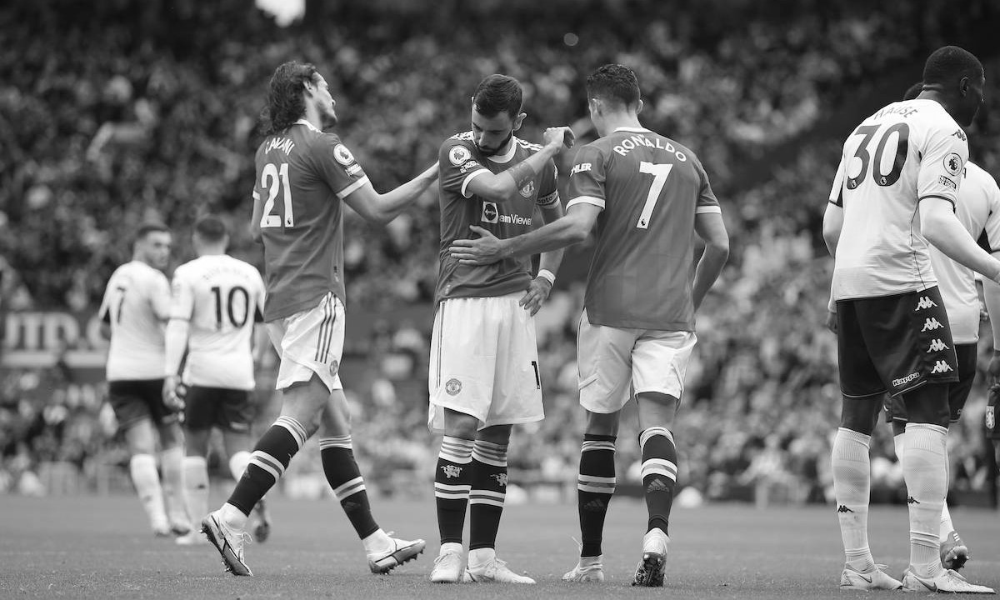

In [ ]:
#Read and show img
img = cv2.imread('/content/test.jpg', cv2.IMREAD_GRAYSCALE)
cv2_imshow(img)

In [ ]:
print(img.shape)

(720, 1200)


In [ ]:
#PCA Image
my_pca = PCA (n_components =  60)
my_pca.fit(img)
pca_img = my_pca.transform(img)

In [ ]:
print("Chiều gốc: ", img.shape)
print("Chiều sau PCA:" , pca_img.shape)

Chiều gốc:  (720, 1200)
Chiều sau PCA: (720, 60)


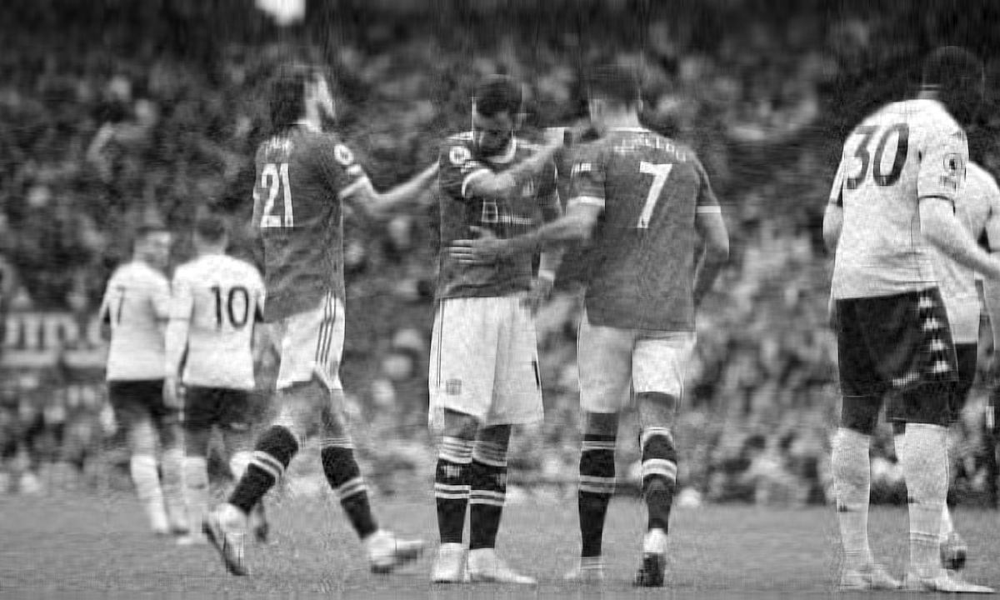

In [ ]:
#Recreate PCA-img
temp = my_pca.inverse_transform(pca_img)
cv2_imshow(temp)

### PCA

In [ ]:
from IPython.display import Audio
from scipy.io import wavfile
import numpy as np
from sklearn.decomposition import PCA
import librosa
import math

In [ ]:
#load sound and rate
sample_rate, sound = wavfile.read('/content/drive/MyDrive/CS116/sample.wav')

In [ ]:
sound.shape

(10517504, 2)

In [ ]:
sound = sound[:2629376,:]
sound.shape

(2629376, 2)

In [ ]:
Audio(sound[:,0], rate = sample_rate)

In [ ]:
left_channel = sound[:, 0]
right_channel = sound[:, 1]
print(left_channel.shape)
print(right_channel.shape)
sample = left_channel

(2629376,)
(2629376,)


In [ ]:
nrows = 512
ncols = math.ceil(sample.size/nrows)


#padding zeros
transformed_sound = np.zeros(nrows * ncols)
transformed_sound[:sample.shape[0]] = sample

#reshape
transformed_sound = np.reshape(transformed_sound, (nrows, ncols))

print("transformed_sound shape: ", transformed_sound.shape)

transformed_sound shape:  (512, 5136)


In [ ]:
#PCA
pca = PCA(512).fit(transformed_sound) 
reduced_audio = pca.transform(transformed_sound)
print("reduced shape", reduced_audio.shape)


# Restore
temp = pca.inverse_transform(reduced_audio )
temp = np.reshape(temp, (-1))[:sample.shape[0]]
temp.shape

reduced shape (512, 512)


(2629376,)

In [ ]:
Audio(temp, rate=sample_rate)